## Notebook to score cells based on gene set

attempt to use this functionality for determing scores for
- disease associated microglia (DAM) 
    - Hu Y, Fryatt GL, Ghorbani M et al. Replicative senescence dictates the emergence of disease-associated microglia and contributes to Aβ pathology. Cell Rep 2021;35:109228.
    https://www.sciencedirect.com/science/article/pii/S2211124721005799
        - "DAM signature (Cst7, Csf1, Lpl, Apoe, Spp1, Cd74, Itgax)"
- senescence
    - Hu Y, Fryatt GL, Ghorbani M et al. Replicative senescence dictates the emergence of disease-associated microglia and contributes to Aβ pathology. Cell Rep 2021;35:109228.
    https://www.sciencedirect.com/science/article/pii/S2211124721005799?via%3Dihub
        - "custom senescence signature (Cdkn2a, Cdkn1a, Cdkn2d, Casp8, Il1b, Glb1, Serpine1)"
    - Tabula Muris Consortium. A single-cell transcriptomic atlas characterizes ageing tissues in the mouse. Nature 2020;583:590–5.
    https://pubmed.ncbi.nlm.nih.gov/32669714/
        - Canonical Senescence Pathway (ATM,BMI1,CCND1,CCNE1,CDK2,CDK4,CDK6,CDKN1A,CDKN2A,CDKN2D,CHEK1,CHEK2,E2F1,E2F3,ETS1,ETS2,MDM2,RB1,RBL2,SATB1,TP53,TWIST1)
        - Senescence Responses (AKT1,CALR,CCL2,CCL20,CCL5,CCL8,CD44,COL1A1,COL3A1,CSF2,CXCL1,CXCL2,CXCL5,CXCL8,FGF2,FGF7,FN1,GLB1,ICAM,IGFBP2,IGFBP4,IGFBP7,IL11,IL1A,IL1B,IL6,LIP,LMNB1,MMP1,MMP10,MMP12,MMP3,NFIA,PLAUR,PTEN,SPARC,SERPINB2,SERPINE1,TBX2,TBX3,TGFB1I1,THBS1\xca(TSP-1),TIMP1,TIMP2,TNF,VEGFA,VEGFB,VIM)
        - Senescence Initiators (ABL1,AKT1,ALDH1A3,CCNA2,CCNB1,CDC25C,CDKN1B,CDKN1C,CDKN2B,CDKN2C,CITED2,CREG1,EGR1,GADD45A,GSK3B,HRAS,ID1,IFNG,IGF1,IGF1R,IGFBP3,IGFBP5,IGFBP7,ING1,IRF3,IRF5,IRF7,MAP2K1,,MAP2K3,MAP2K6,MAPK14,MAPK14,MORC3,MYC,NBN,NFKB1,NOX4,PCNA,PIK3CA,PLAU,PRKCD,RBL1,SIRT1,SOD1,SOD2,TERF2,TERT,TGFB1,TP53BP1)
    


In [1]:
!date

Tue Oct 18 10:40:10 EDT 2022


#### import libraries

In [2]:
import scanpy as sc
from anndata import AnnData
from numpy import ndarray
from random import seed, randint
from scipy.stats import zscore, shapiro, kstest, norm
from pandas import DataFrame
import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context
from seaborn import scatterplot, displot

%matplotlib inline
# for white background of figures (only for docs rendering)
%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}
%config InlineBackend.figure_format='retina'

import warnings
warnings.filterwarnings(action='ignore')

#### set notebook variables

In [3]:
# naming
project = 'aging'

# directories 
wrk_dir = f'/labshare/raph/datasets/adrd_neuro/{project}'
quants_dir = f'{wrk_dir}/demux'

# in files
in_file = f'{quants_dir}/{project}.pegasus.leiden_085.subclustered.h5ad'

# variables
DEBUG = True
dpi_value = 50
gene_sets = {'DAM': ['CST7', 'CSF1', 'LPL', 'APOE', 'SPP1', 'CD74', 'ITGAX'],
             'CSS': ['CDKN2A', 'CDKN1A', 'CDKN2D', 'CASO8', 'IL1B', 'GLB1', 'SERPINE1'],
             'CSP': ['ATM', 'BMI1', 'CCND1', 'CCNE1', 'CDK2', 'CDK4', 'CDK6', 
                     'CDKN1A', 'CDKN2A', 'CDKN2D', 'CHEK1', 'CHEK2', 'E2F1', 
                     'E2F3', 'ETS1', 'ETS2', 'MDM2', 'RB1', 'RBL2', 'SATB1', 
                     'TP53', 'TWIST1'],
             'SR': ['AKT1', 'CALR', 'CCL2', 'CCL20', 'CCL5', 'CCL8', 'CD44', 
                    'COL1A1', 'COL3A1', 'CSF2', 'CXCL1', 'CXCL2', 'CXCL5', 
                    'CXCL8', 'FGF2', 'FGF7', 'FN1', 'GLB1', 'ICAM', 'IGFBP2', 
                    'IGFBP4', 'IGFBP7', 'IL11', 'IL1A', 'IL1B', 'IL6', 'LIP',
                    'LMNB1', 'MMP1', 'MMP10', 'MMP12', 'MMP3', 'NFIA', 'PLAUR', 
                    'PTEN', 'SPARC', 'SERPINB2', 'SERPINE1', 'TBX2', 'TBX3', 
                    'TGFB1I1', 'THBS1\xca(TSP-1)', 'TIMP1', 'TIMP2', 'TNF', 
                    'VEGFA', 'VEGFB', 'VIM'],
             'SI': ['ABL1', 'AKT1', 'ALDH1A3', 'CCNA2', 'CCNB1', 'CDC25C', 
                    'CDKN1B', 'CDKN1C', 'CDKN2B', 'CDKN2C', 'CITED2', 'CREG1', 
                    'EGR1', 'GADD45A', 'GSK3B', 'HRAS', 'ID1', 'IFNG', 'IGF1', 
                    'IGF1R', 'IGFBP3', 'IGFBP5', 'IGFBP7', 'ING1', 'IRF3', 
                    'IRF5', 'IRF7', 'MAP2K1', 'MAP2K3', 'MAP2K6', 'MAPK14', 
                    'MAPK14', 'MORC3', 'MYC', 'NBN', 'NFKB1', 'NOX4', 'PCNA', 
                    'PIK3CA', 'PLAU', 'PRKCD', 'RBL1', 'SIRT1', 'SOD1', 'SOD2',
                    'TERF2', 'TERT', 'TGFB1', 'TP53BP1']}
exclude_cell_types = ['uncertain', 'uncertain-2', 'uncertain-3', 'Astrocyte-GFAP-Hi']
seed(42)

#### utilitiy functions

In [4]:
def test_score_normality(scores):
    stat, p = shapiro(scores)
    if p > 0.05:
        print(f'by Shapiro is Gaussian p={p}, stat={stat}')
    else:
        print(f'by Shapiro is not Gaussian p={p}, stat={stat}')
    stat, p = kstest(scores, norm.cdf)
    if p > 0.05:
        print(f'by Kolmogorov-Smirnov is Gaussian p={p}, stat={stat}')
    else:
        print(f'by Kolmogorov-Smirnov is not Gaussian p={p}, stat={stat}')
    
    
def score_gene_set(data: AnnData, set_name: str, genes: list, iter_cnt: int=100, 
                   num_devs: int=2, verbose: bool=False):
    print(f'scoring {set_name}')
    score_name = f'{set_name}_score'
    scores = ndarray(shape=(data.obs.shape[0], iter_cnt), dtype=float)
    print('bootstrapping score_genes', end='.')
    for index in range(0, iter_cnt):
        print(index, end='.')
        genes = list(set(gene_sets[set_name]) & set(data.var.index))
        temp_data = sc.tl.score_genes(data, genes, score_name=score_name, 
                                      copy=True, random_state=randint(0, 9999))
        scores[:,index] = temp_data.obs[score_name]
    data.obs[score_name] = scores.mean(axis=1)
    # binarize score
    data.obs[f'is{set_name}'] = zscore(scores.mean(axis=1)) > num_devs
    # test normality of score
    test_score_normality(data.obs[score_name])
    # plot score distribution
    with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
        plt.style.use('seaborn-bright')
        displot(x=score_name, data=data.obs, kind='kde')
    # plot standardized score distribution
    with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
        plt.style.use('seaborn-bright')
        displot(x=zscore(scores.mean(axis=1)), kind='kde')
        plt.show()
    
    data.obs[f'is{set_name}'].replace({True: set_name, False: f'non{set_name}'}, inplace=True)
    # find proportion of total cells where condition exists
    positive_cnt = data.obs.loc[data.obs[f'is{set_name}'] == set_name].shape[0]
    total_cnt = data.obs.shape[0]
    positive_frac = round(positive_cnt/total_cnt, 3)
    print(f'\nFractions of cells positive for {set_name} is {positive_frac} or \
{positive_cnt} of {total_cnt}')        
    print('visualizing', end='.')
    
    # show positive cells by Age
    with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
        plt.style.use('seaborn-bright')
        scatterplot(x='Age', y=score_name, data=data.obs, hue=f'is{set_name}')    
    # show dotplots of genes by cell-type and age group
    this_set = list(set(genes) & set(data.var.index))
    with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
        plt.style.use('seaborn-bright')
        sc.pl.dotplot(data, this_set, groupby='new_anno', 
                      mean_only_expressed=True)
    with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
        plt.style.use('seaborn-bright')
        sc.pl.dotplot(data, this_set, groupby='Age_group', 
                      mean_only_expressed=True)
    with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
        plt.style.use('seaborn-bright')
        sc.pl.dotplot(data, this_set, groupby=f'is{set_name}', 
                      mean_only_expressed=True)
        
    # visualize umap of positive cells and score
    pos_data = data[data.obs[f'is{set_name}'] == set_name]
    with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
        plt.style.use('seaborn-bright')
        sc.pl.umap(pos_data, color=['new_anno', score_name], legend_loc='on data')
    # visualize binarized score
    sc.tl.embedding_density(data, groupby=f'is{set_name}')
    with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
        plt.style.use('seaborn-bright')
        sc.pl.embedding_density(data, groupby=f'is{set_name}')
        
    # get counts by cell-type and brain region
    display(data.obs.groupby('new_anno')[f'is{set_name}'].value_counts())
    display(data.obs.groupby('Brain_region')[f'is{set_name}'].value_counts())    

### read the anndata (h5ad) file

In [5]:
%%time
adata = sc.read(in_file, cache=True)
print(adata)

Only considering the two last: ['.subclustered', '.h5ad'].
Only considering the two last: ['.subclustered', '.h5ad'].
AnnData object with n_obs × n_vars = 167945 × 35441
    obs: 'pool_name', 'Sample_id', 'Tissue_source', 'Brain_region', 'Clinical_diagnosis', 'Age', 'Sex', 'donor_id', 'lane_num', 'Channel', 'n_genes', 'n_counts', 'percent_mito', 'scale', 'Group', 'leiden_labels', 'anno', 'leiden_labels_085', 'new_anno', 'Age_group', 'broad_celltype'
    var: 'n_cells', 'percent_cells', 'robust', 'highly_variable_features', 'mean', 'var', 'hvf_loess', 'hvf_rank'
    uns: 'Channels', 'Groups', 'PCs', 'W_diffmap', 'W_pca_harmony', 'broad_celltype_colors', 'c2gid', 'df_qcplot', 'diffmap_evals', 'diffmap_knn_distances', 'diffmap_knn_indices', 'genome', 'gncells', 'leiden_resolution', 'modality', 'ncells', 'new_anno_colors', 'norm_count', 'pca', 'pca_features', 'pca_harmony_knn_distances', 'pca_harmony_knn_indices', 'stdzn_max_value', 'stdzn_mean', 'stdzn_std'
    obsm: 'X_diffmap', 'X_fle',

### Plot the clusters

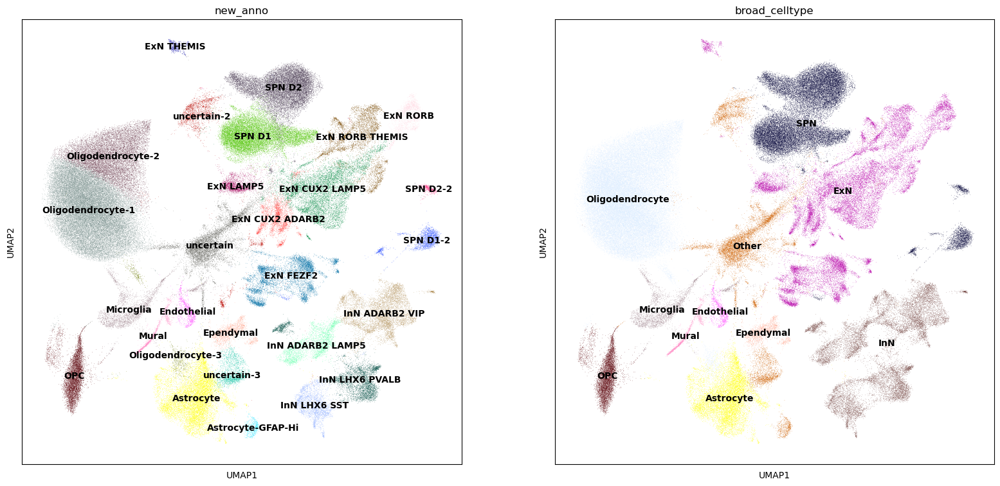

In [6]:
with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
    plt.style.use('seaborn-bright')
    sc.pl.umap(adata, color=['new_anno', 'broad_celltype'], legend_loc='on data')

In [7]:
adata.obs.broad_celltype.value_counts()

Oligodendrocyte      50129
SPN                  33512
ExN                  28483
InN                  17733
Other                12753
Astrocyte            11289
OPC                   6682
Microglia             3265
Ependymal             1853
Mural                 1293
Endothelial            953
ExN LAMP5                0
SPN D2                   0
ExN CUX2 ADARB2          0
ExN CUX2 LAMP5           0
ExN FEZF2                0
uncertain-3              0
Oligodendrocyte-3        0
uncertain-2              0
uncertain                0
SPN D2-2                 0
SPN D1-2                 0
ExN RORB                 0
SPN D1                   0
Radial Glia              0
Astrocyte-GFAP-Hi        0
Oligodendrocyte-1        0
InN LHX6 SST             0
InN LHX6 PVALB           0
InN ADARB2 VIP           0
InN ADARB2 LAMP5         0
ExN THEMIS               0
ExN RORB THEMIS          0
Oligodendrocyte-2        0
Name: broad_celltype, dtype: int64

### remove cell-types that are known excludes

In [8]:
adata = adata[~adata.obs.new_anno.isin(exclude_cell_types)]
print(adata)

View of AnnData object with n_obs × n_vars = 155192 × 35441
    obs: 'pool_name', 'Sample_id', 'Tissue_source', 'Brain_region', 'Clinical_diagnosis', 'Age', 'Sex', 'donor_id', 'lane_num', 'Channel', 'n_genes', 'n_counts', 'percent_mito', 'scale', 'Group', 'leiden_labels', 'anno', 'leiden_labels_085', 'new_anno', 'Age_group', 'broad_celltype'
    var: 'n_cells', 'percent_cells', 'robust', 'highly_variable_features', 'mean', 'var', 'hvf_loess', 'hvf_rank'
    uns: 'Channels', 'Groups', 'PCs', 'W_diffmap', 'W_pca_harmony', 'broad_celltype_colors', 'c2gid', 'df_qcplot', 'diffmap_evals', 'diffmap_knn_distances', 'diffmap_knn_indices', 'genome', 'gncells', 'leiden_resolution', 'modality', 'ncells', 'new_anno_colors', 'norm_count', 'pca', 'pca_features', 'pca_harmony_knn_distances', 'pca_harmony_knn_indices', 'stdzn_max_value', 'stdzn_mean', 'stdzn_std'
    obsm: 'X_diffmap', 'X_fle', 'X_pca', 'X_pca_harmony', 'X_phi', 'X_umap', 'X_umap_085'
    varm: 'de_res', 'gmeans', 'gstds', 'means', 'pa

### replot the clusters without the excluded celltypes

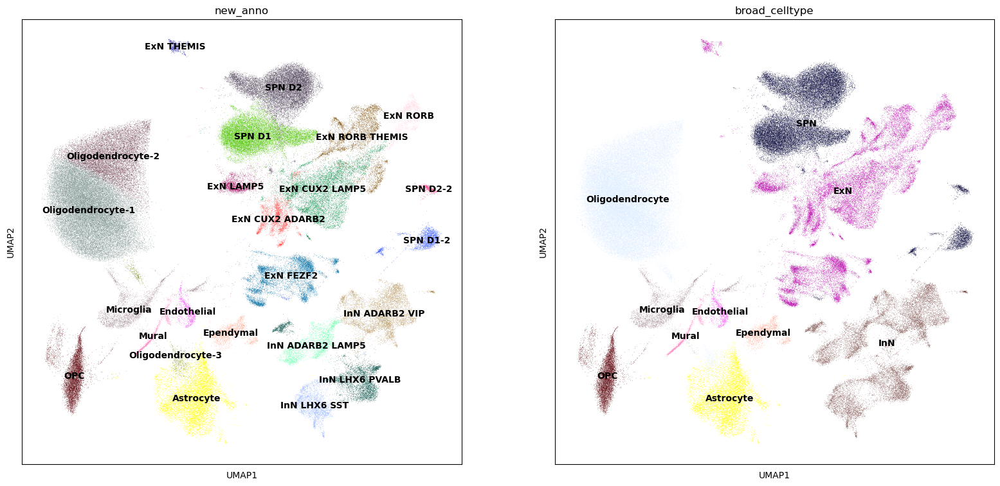

In [9]:
with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
    plt.style.use('seaborn-bright')
    sc.pl.umap(adata, color=['new_anno', 'broad_celltype'], legend_loc='on data')

In [10]:
adata.obs.new_anno.value_counts()

Oligodendrocyte-1    36479
SPN D1               15379
SPN D2               15280
Oligodendrocyte-2    12844
Astrocyte            11289
ExN CUX2 LAMP5        9055
InN ADARB2 VIP        7014
ExN FEZF2             6842
OPC                   6682
ExN RORB THEMIS       5130
InN LHX6 PVALB        4566
Microglia             3265
InN ADARB2 LAMP5      3216
ExN CUX2 ADARB2       3066
InN LHX6 SST          2937
SPN D1-2              2388
ExN RORB              1966
ExN LAMP5             1963
Ependymal             1853
Mural                 1293
Endothelial            953
Oligodendrocyte-3      806
SPN D2-2               465
ExN THEMIS             461
Name: new_anno, dtype: int64

### generate density plot for brain region

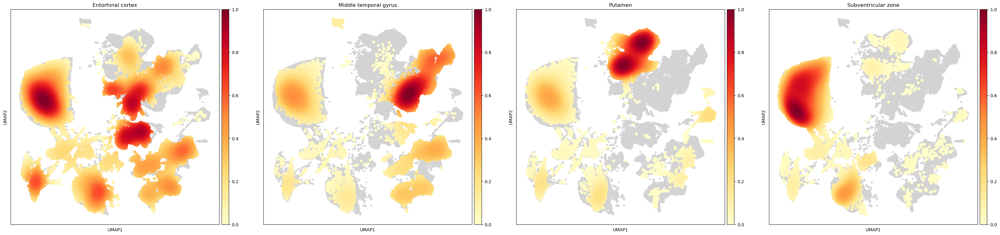

In [11]:
sc.tl.embedding_density(adata, groupby='Brain_region')
with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
    plt.style.use('seaborn-bright')
    sc.pl.embedding_density(adata, groupby='Brain_region')

### generate density plot for age group

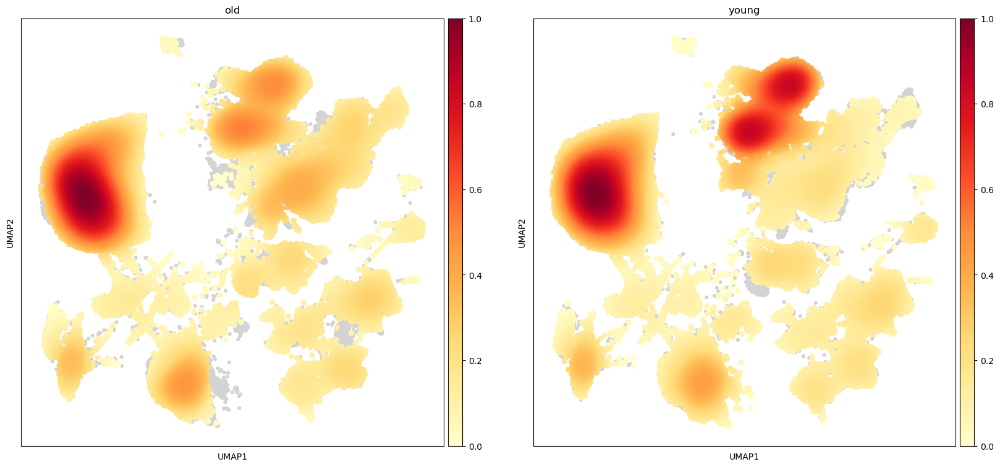

In [12]:
sc.tl.embedding_density(adata, groupby='Age_group')
with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
    plt.style.use('seaborn-bright')
    sc.pl.embedding_density(adata, groupby='Age_group')

### score the DAM

AnnData object with n_obs × n_vars = 3265 × 35441
    obs: 'pool_name', 'Sample_id', 'Tissue_source', 'Brain_region', 'Clinical_diagnosis', 'Age', 'Sex', 'donor_id', 'lane_num', 'Channel', 'n_genes', 'n_counts', 'percent_mito', 'scale', 'Group', 'leiden_labels', 'anno', 'leiden_labels_085', 'new_anno', 'Age_group', 'broad_celltype', 'umap_density_Brain_region', 'umap_density_Age_group'
    var: 'n_cells', 'percent_cells', 'robust', 'highly_variable_features', 'mean', 'var', 'hvf_loess', 'hvf_rank'
    uns: 'Channels', 'Groups', 'PCs', 'W_diffmap', 'W_pca_harmony', 'broad_celltype_colors', 'c2gid', 'df_qcplot', 'diffmap_evals', 'diffmap_knn_distances', 'diffmap_knn_indices', 'genome', 'gncells', 'leiden_resolution', 'modality', 'ncells', 'new_anno_colors', 'norm_count', 'pca', 'pca_features', 'pca_harmony_knn_distances', 'pca_harmony_knn_indices', 'stdzn_max_value', 'stdzn_mean', 'stdzn_std', 'umap_density_Brain_region_params', 'umap_density_Age_group_params'
    obsm: 'X_diffmap', 'X_f

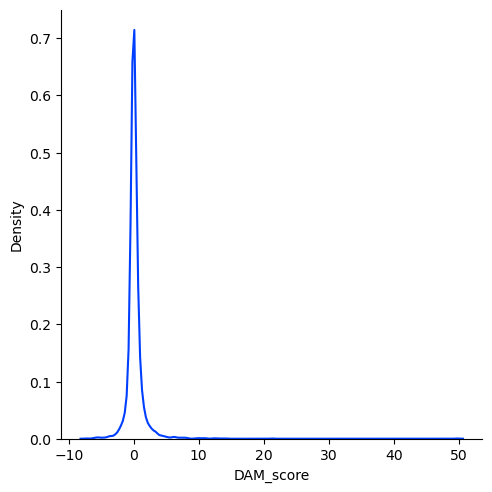

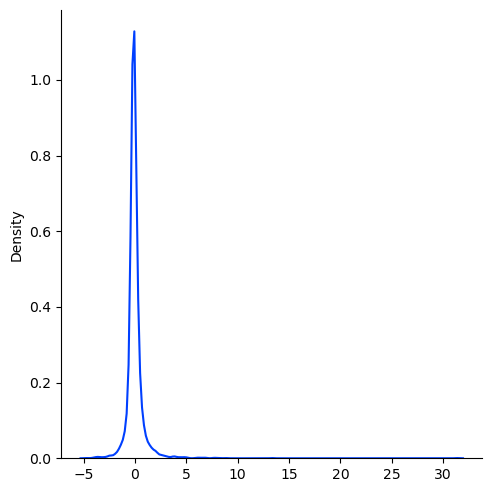


Fractions of cells positive for DAM is 0.055 or 178 of 3265
visualizing.

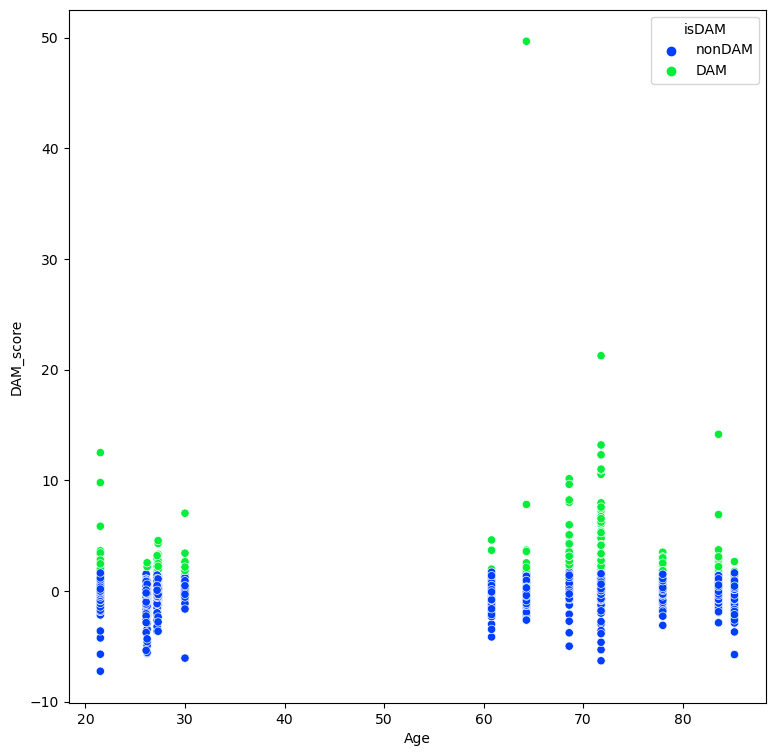

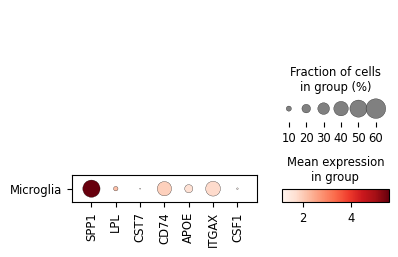

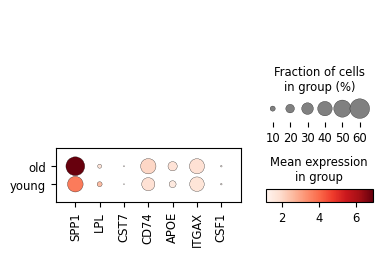

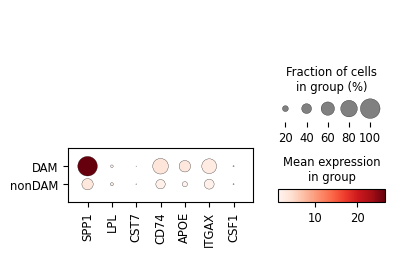

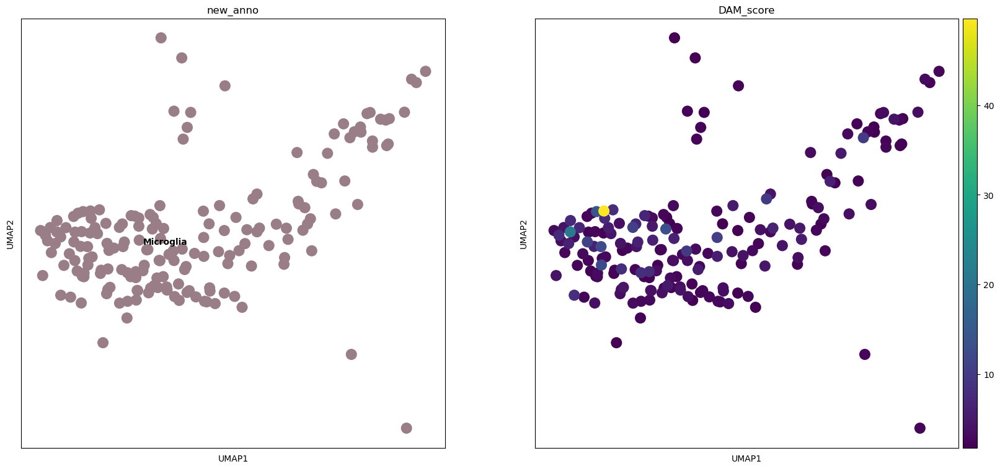

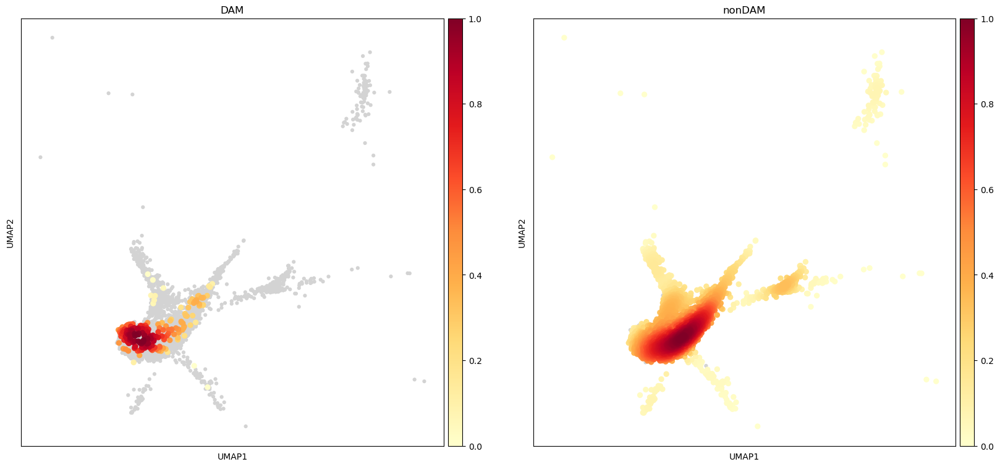

new_anno         
Microglia  nonDAM    3087
           DAM        178
Name: isDAM, dtype: int64

Brain_region                 
Entorhinal cortex      nonDAM    1210
                       DAM          9
Middle temporal gyrus  nonDAM     256
                       DAM          2
Putamen                nonDAM     661
                       DAM          9
Subventricular zone    nonDAM     960
                       DAM        158
Name: isDAM, dtype: int64

CPU times: user 27.8 s, sys: 2.17 s, total: 29.9 s
Wall time: 19.3 s


In [13]:
%%time
mg_data = adata[adata.obs.broad_celltype == 'Microglia'].copy()
print(mg_data)
score_gene_set(mg_data, 'DAM', gene_sets['DAM'], num_devs=1, verbose=DEBUG)

### score the CSS, custom senescence signature

scoring CSS
bootstrapping score_genes.0.1.2.3.4.5.6.7.8.9.10.11.12.13.14.15.16.17.18.19.20.21.22.23.24.25.26.27.28.29.30.31.32.33.34.35.36.37.38.39.40.41.42.43.44.45.46.47.48.49.50.51.52.53.54.55.56.57.58.59.60.61.62.63.64.65.66.67.68.69.70.71.72.73.74.75.76.77.78.79.80.81.82.83.84.85.86.87.88.89.90.91.92.93.94.95.96.97.98.99.by Shapiro is not Gaussian p=0.0, stat=0.6800997257232666
by Kolmogorov-Smirnov is not Gaussian p=0.0, stat=0.357629570972962


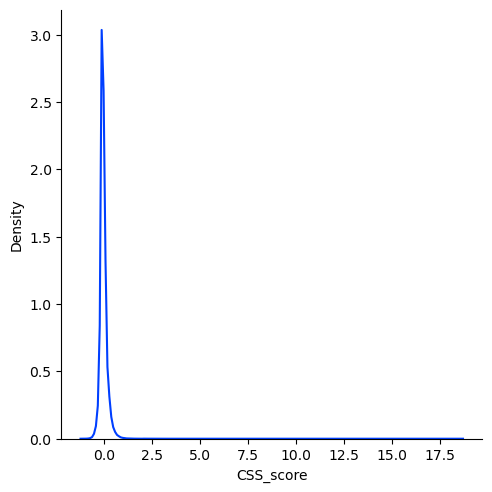

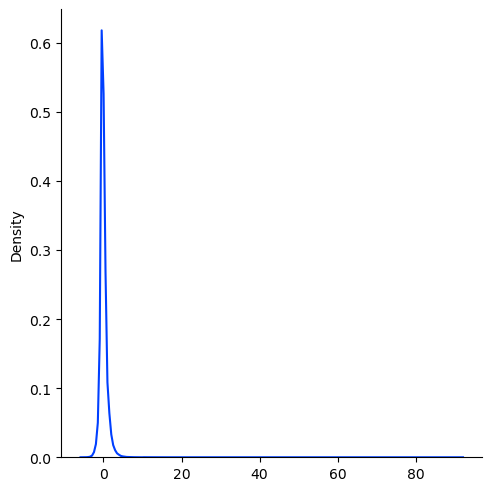


Fractions of cells positive for CSS is 0.029 or 4536 of 155192
visualizing.

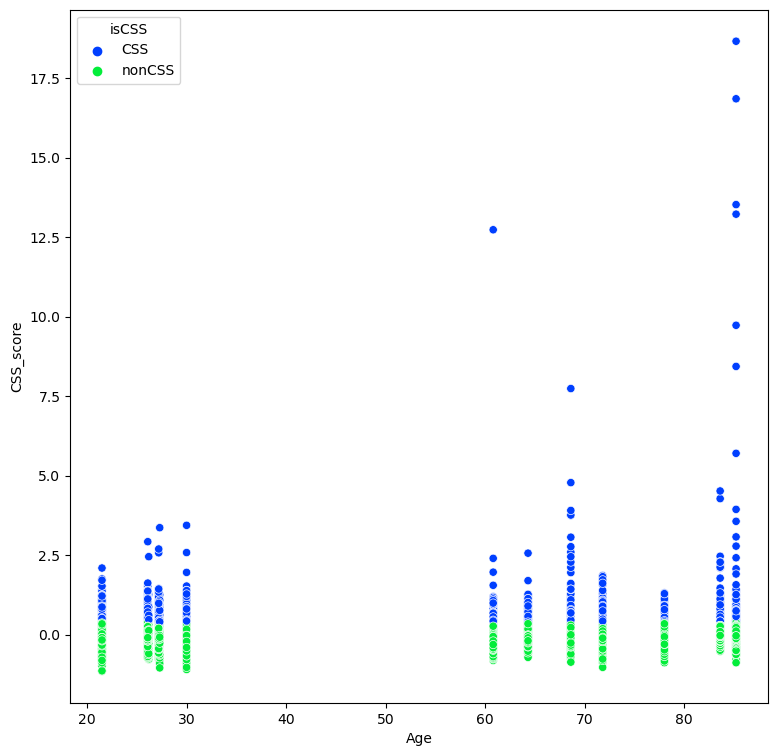

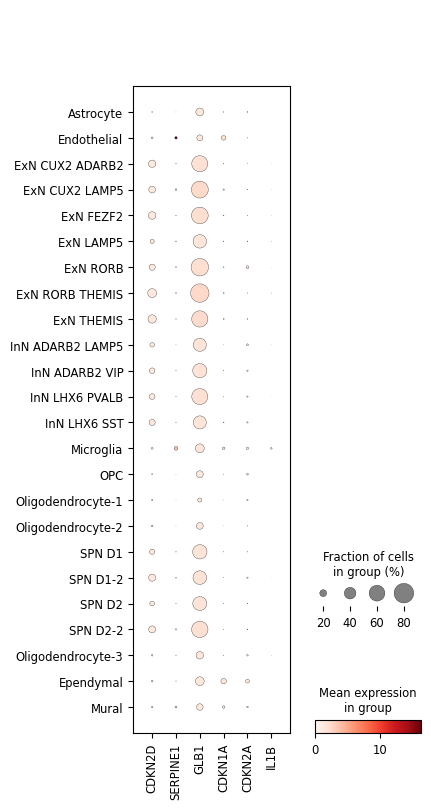

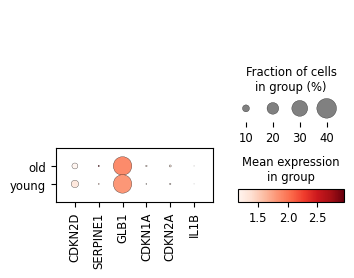

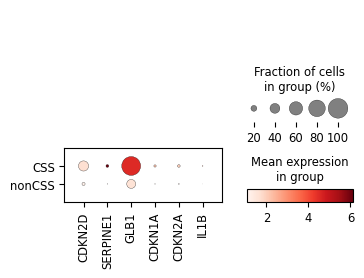

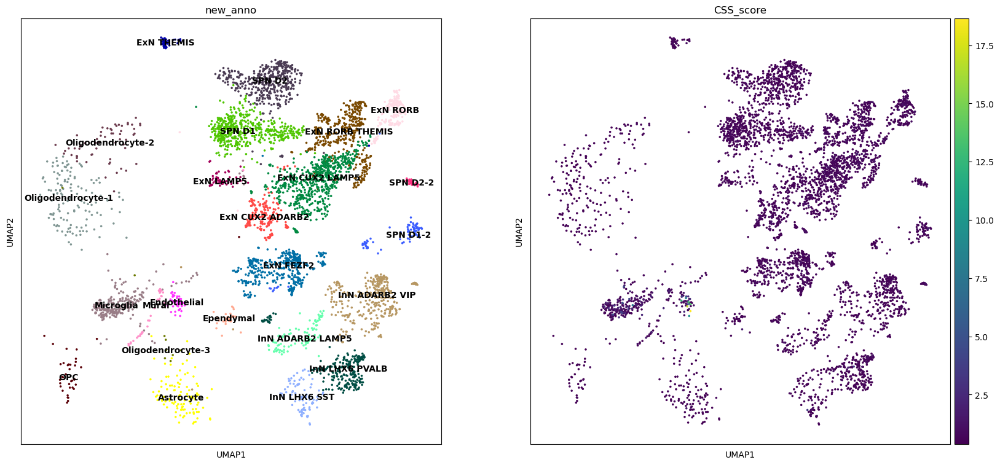

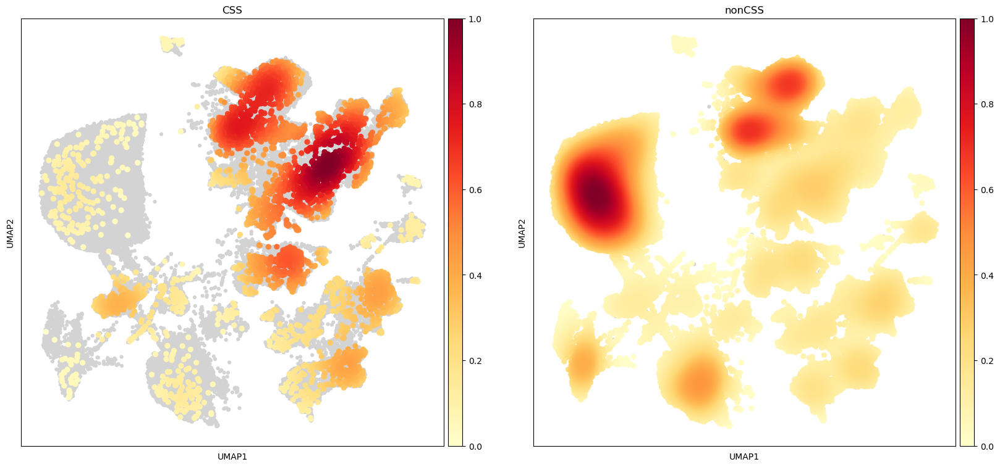

new_anno                 
Astrocyte          nonCSS    11182
                   CSS         107
Endothelial        nonCSS      908
                   CSS          45
ExN CUX2 ADARB2    nonCSS     2873
                   CSS         193
ExN CUX2 LAMP5     nonCSS     8384
                   CSS         671
ExN FEZF2          nonCSS     6419
                   CSS         423
ExN LAMP5          nonCSS     1910
                   CSS          53
ExN RORB           nonCSS     1779
                   CSS         187
ExN RORB THEMIS    nonCSS     4713
                   CSS         417
ExN THEMIS         nonCSS      421
                   CSS          40
InN ADARB2 LAMP5   nonCSS     3120
                   CSS          96
InN ADARB2 VIP     nonCSS     6671
                   CSS         343
InN LHX6 PVALB     nonCSS     4313
                   CSS         253
InN LHX6 SST       nonCSS     2854
                   CSS          83
Microglia          nonCSS     3025
                   CSS       

Brain_region                 
Entorhinal cortex      nonCSS    46088
                       CSS        1468
Middle temporal gyrus  nonCSS    23965
                       CSS        1429
Putamen                nonCSS    45446
                       CSS        1043
Subventricular zone    nonCSS    35157
                       CSS         596
Name: isCSS, dtype: int64

CPU times: user 15min 53s, sys: 1min 47s, total: 17min 41s
Wall time: 16min 57s


In [14]:
%%time
score_gene_set(adata, 'CSS', gene_sets['CSS'], verbose=DEBUG)

### score the CSP, Canonical Senescence Pathway

scoring CSP
bootstrapping score_genes.0.1.2.3.4.5.6.7.8.9.10.11.12.13.14.15.16.17.18.19.20.21.22.23.24.25.26.27.28.29.30.31.32.33.34.35.36.37.38.39.40.41.42.43.44.45.46.47.48.49.50.51.52.53.54.55.56.57.58.59.60.61.62.63.64.65.66.67.68.69.70.71.72.73.74.75.76.77.78.79.80.81.82.83.84.85.86.87.88.89.90.91.92.93.94.95.96.97.98.99.by Shapiro is not Gaussian p=0.0, stat=0.8206058740615845
by Kolmogorov-Smirnov is not Gaussian p=0.0, stat=0.39852018891334795


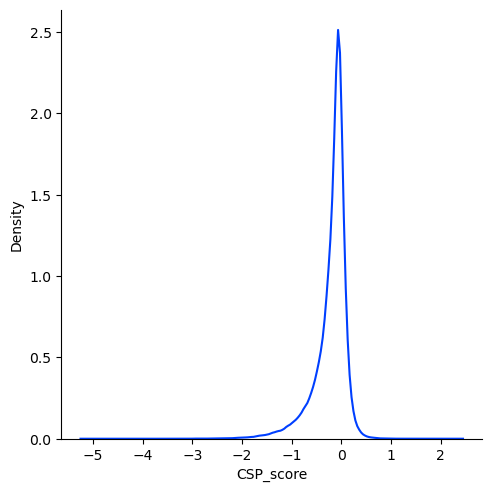

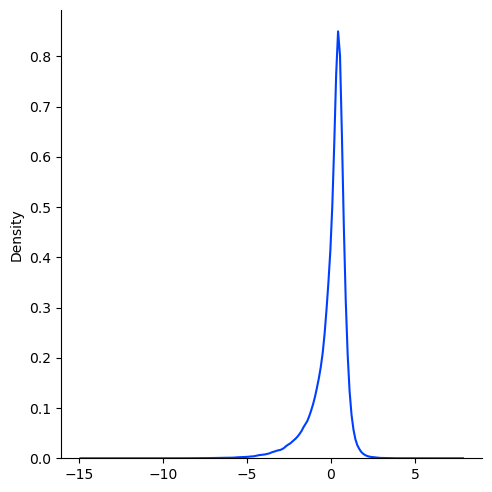


Fractions of cells positive for CSP is 0.003 or 456 of 155192
visualizing.

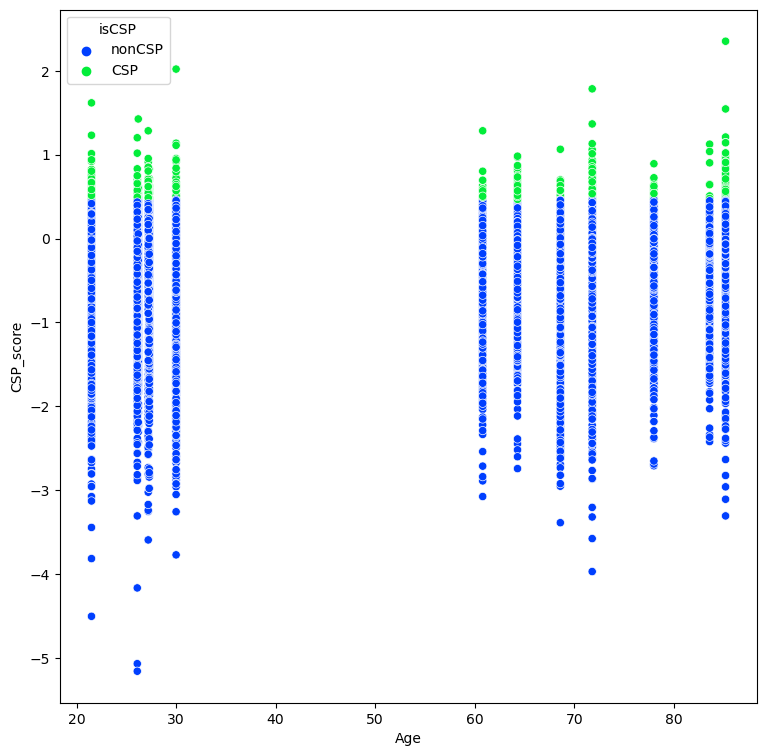

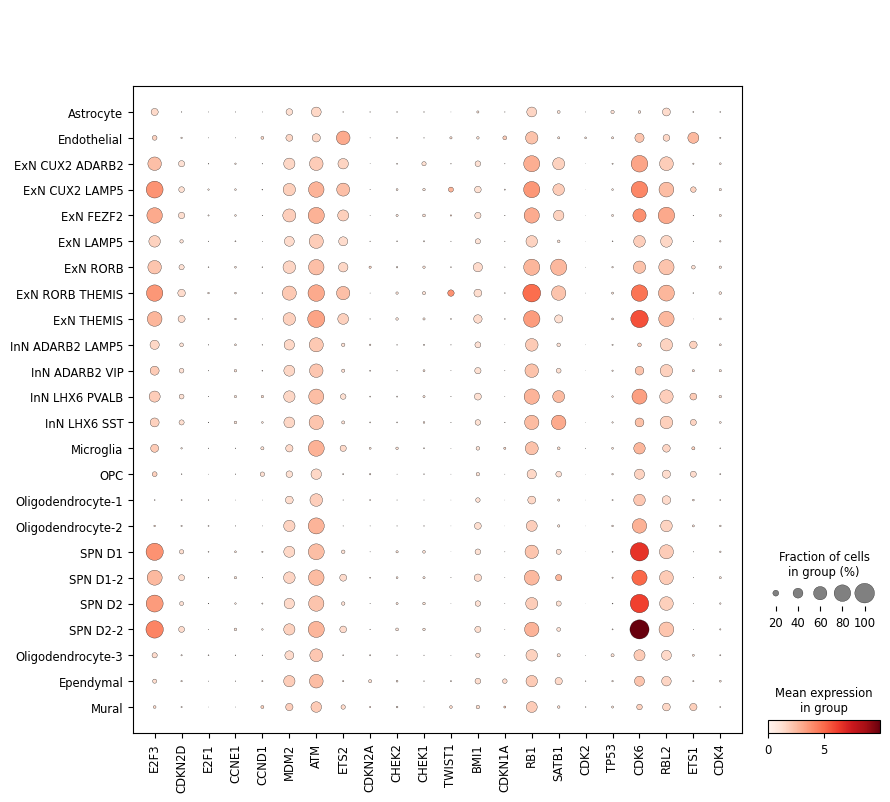

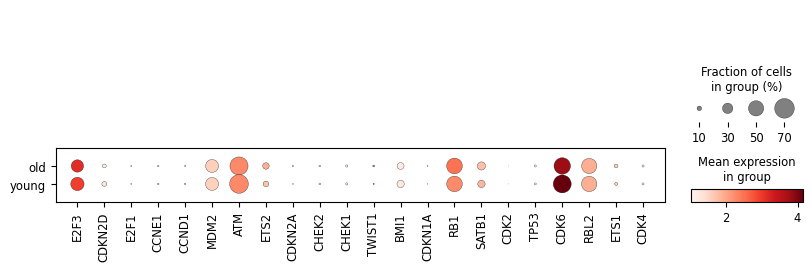

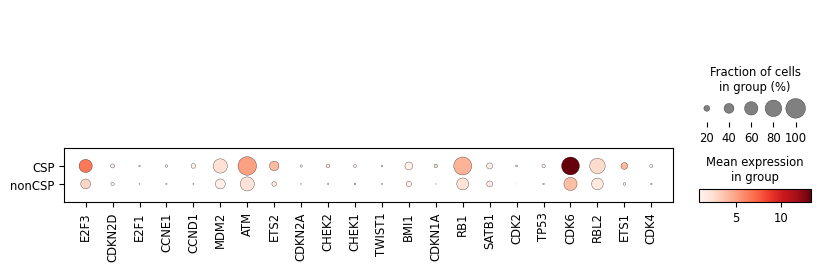

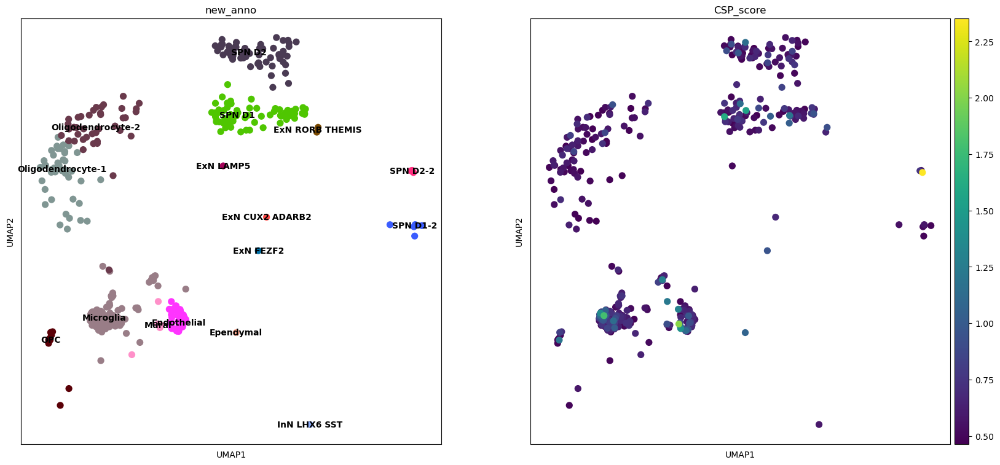

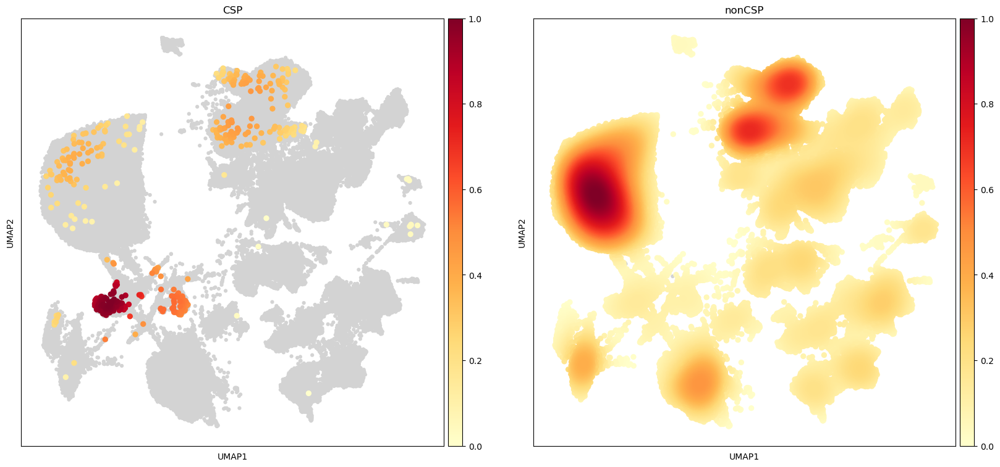

new_anno                 
Astrocyte          nonCSP    11289
                   CSP           0
Endothelial        nonCSP      893
                   CSP          60
ExN CUX2 ADARB2    nonCSP     3065
                   CSP           1
ExN CUX2 LAMP5     nonCSP     9055
                   CSP           0
ExN FEZF2          nonCSP     6841
                   CSP           1
ExN LAMP5          nonCSP     1962
                   CSP           1
ExN RORB           nonCSP     1966
                   CSP           0
ExN RORB THEMIS    nonCSP     5128
                   CSP           2
ExN THEMIS         nonCSP      461
                   CSP           0
InN ADARB2 LAMP5   nonCSP     3216
                   CSP           0
InN ADARB2 VIP     nonCSP     7014
                   CSP           0
InN LHX6 PVALB     nonCSP     4566
                   CSP           0
InN LHX6 SST       nonCSP     2936
                   CSP           1
Microglia          nonCSP     3117
                   CSP       

Brain_region                 
Entorhinal cortex      nonCSP    47517
                       CSP          39
Middle temporal gyrus  nonCSP    25364
                       CSP          30
Putamen                nonCSP    46325
                       CSP         164
Subventricular zone    nonCSP    35530
                       CSP         223
Name: isCSP, dtype: int64

CPU times: user 16min 20s, sys: 1min 46s, total: 18min 7s
Wall time: 17min 33s


In [15]:
%%time
score_gene_set(adata, 'CSP', gene_sets['CSP'], verbose=DEBUG)

### score the SR, Senescence Responses

scoring SR
bootstrapping score_genes.0.1.2.3.4.5.6.7.8.9.10.11.12.13.14.15.16.17.18.19.20.21.22.23.24.25.26.27.28.29.30.31.32.33.34.35.36.37.38.39.40.41.42.43.44.45.46.47.48.49.50.51.52.53.54.55.56.57.58.59.60.61.62.63.64.65.66.67.68.69.70.71.72.73.74.75.76.77.78.79.80.81.82.83.84.85.86.87.88.89.90.91.92.93.94.95.96.97.98.99.by Shapiro is not Gaussian p=0.0, stat=0.8540375828742981
by Kolmogorov-Smirnov is not Gaussian p=0.0, stat=0.36723993940896515


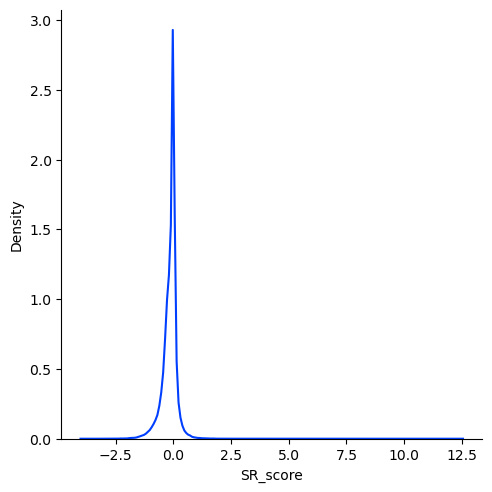

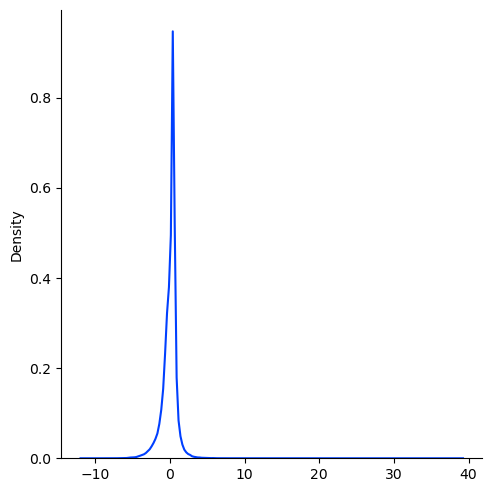


Fractions of cells positive for SR is 0.014 or 2151 of 155192
visualizing.

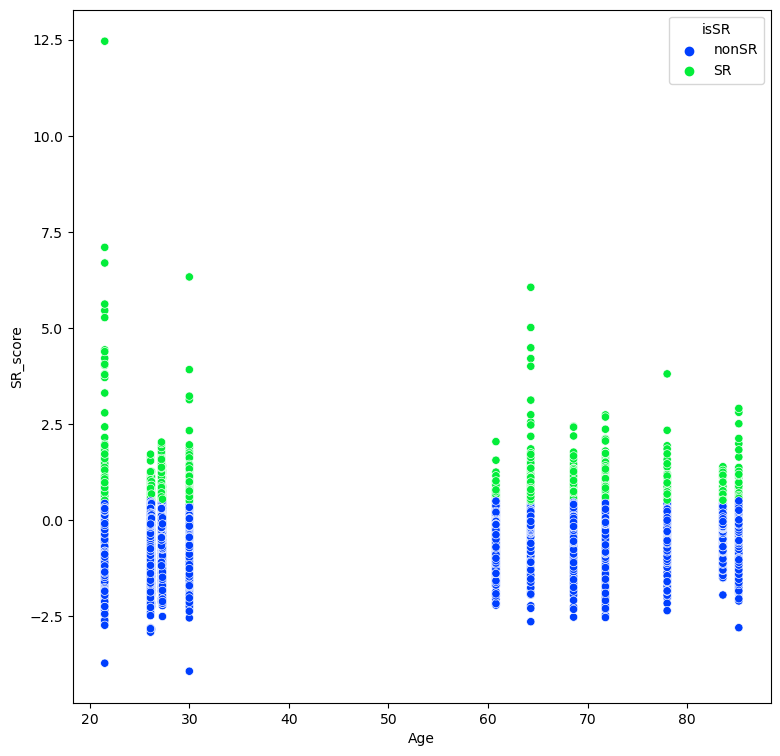

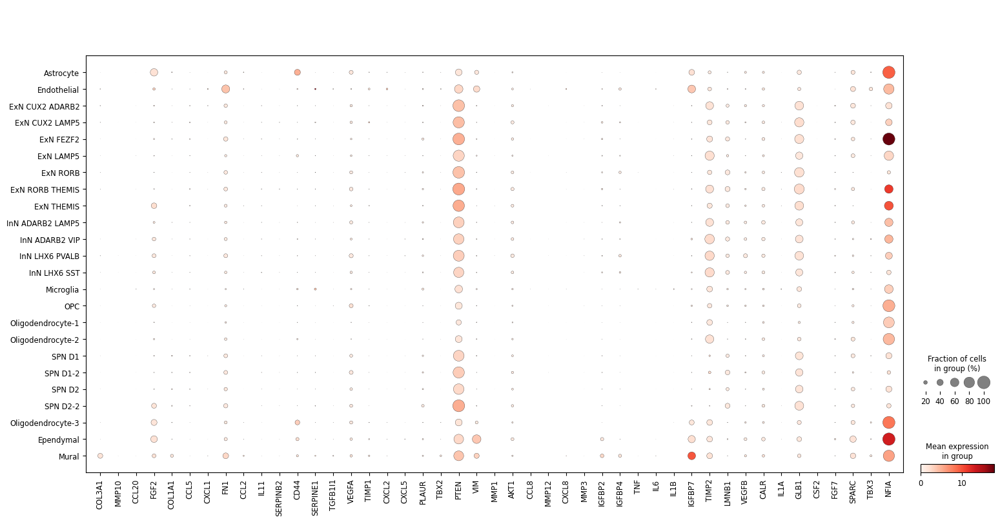

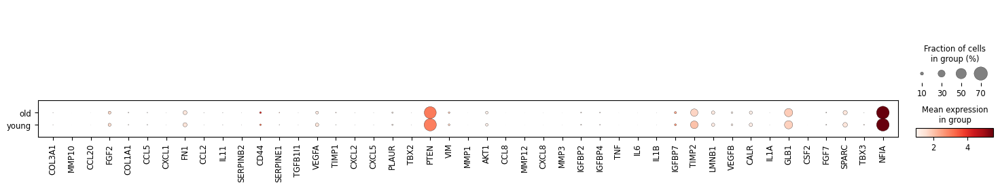

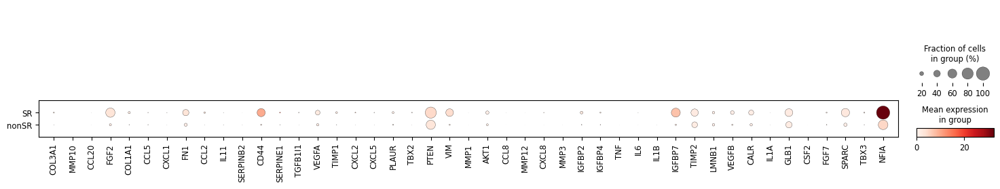

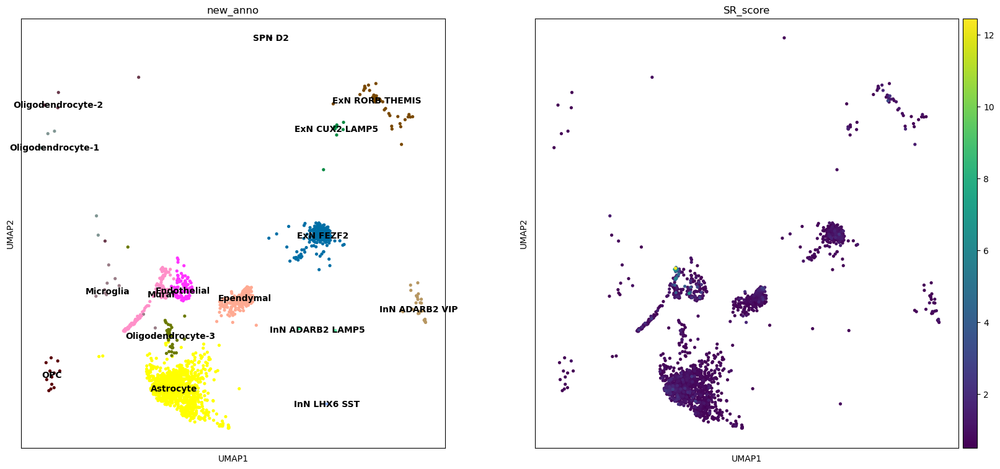

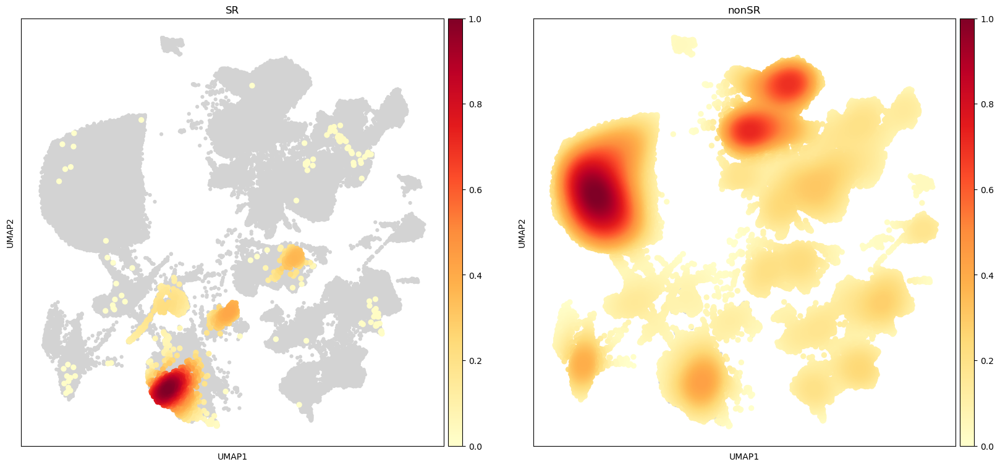

new_anno                
Astrocyte          nonSR    10133
                   SR        1156
Endothelial        nonSR      853
                   SR         100
ExN CUX2 ADARB2    nonSR     3066
                   SR           0
ExN CUX2 LAMP5     nonSR     9046
                   SR           9
ExN FEZF2          nonSR     6566
                   SR         276
ExN LAMP5          nonSR     1963
                   SR           0
ExN RORB           nonSR     1966
                   SR           0
ExN RORB THEMIS    nonSR     5092
                   SR          38
ExN THEMIS         nonSR      461
                   SR           0
InN ADARB2 LAMP5   nonSR     3214
                   SR           2
InN ADARB2 VIP     nonSR     6989
                   SR          25
InN LHX6 PVALB     nonSR     4566
                   SR           0
InN LHX6 SST       nonSR     2936
                   SR           1
Microglia          nonSR     3255
                   SR          10
OPC                nonS

Brain_region                
Entorhinal cortex      nonSR    47105
                       SR         451
Middle temporal gyrus  nonSR    25209
                       SR         185
Putamen                nonSR    46306
                       SR         183
Subventricular zone    nonSR    34421
                       SR        1332
Name: isSR, dtype: int64

CPU times: user 16min 19s, sys: 1min 57s, total: 18min 16s
Wall time: 17min 37s


In [16]:
%%time
score_gene_set(adata, 'SR', gene_sets['SR'], verbose=DEBUG)

### score the SI, Senescence Initiators

scoring SI
bootstrapping score_genes.0.1.2.3.4.5.6.7.8.9.10.11.12.13.14.15.16.17.18.19.20.21.22.23.24.25.26.27.28.29.30.31.32.33.34.35.36.37.38.39.40.41.42.43.44.45.46.47.48.49.50.51.52.53.54.55.56.57.58.59.60.61.62.63.64.65.66.67.68.69.70.71.72.73.74.75.76.77.78.79.80.81.82.83.84.85.86.87.88.89.90.91.92.93.94.95.96.97.98.99.by Shapiro is not Gaussian p=0.0, stat=0.8409847617149353
by Kolmogorov-Smirnov is not Gaussian p=0.0, stat=0.39401903623121837


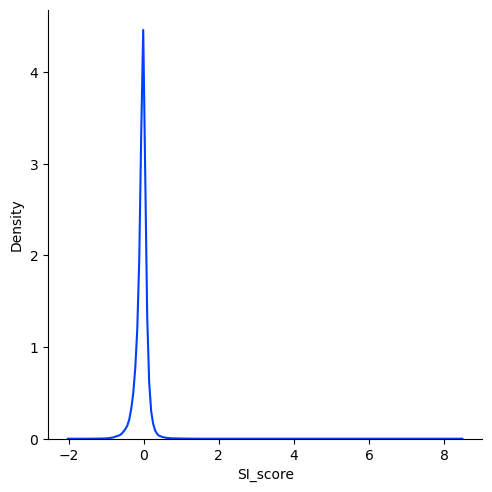

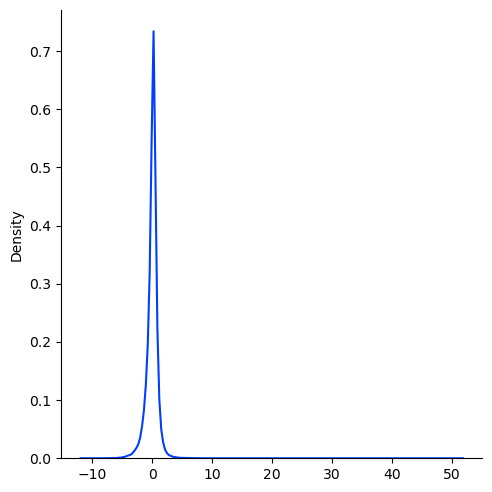


Fractions of cells positive for SI is 0.014 or 2225 of 155192
visualizing.

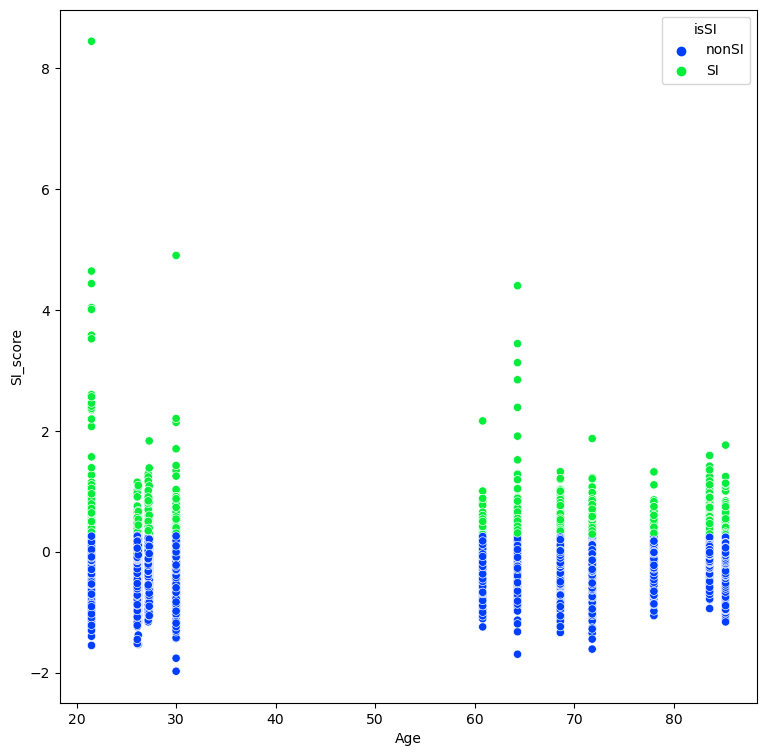

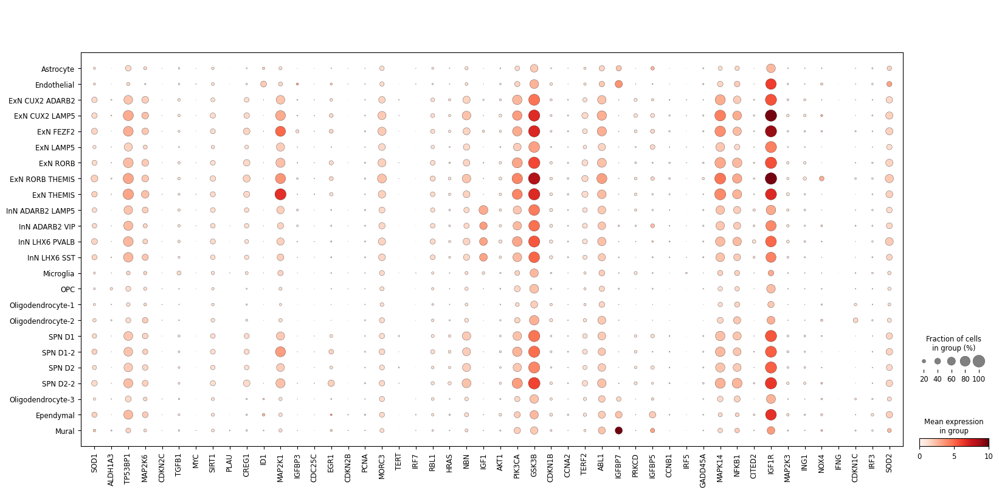

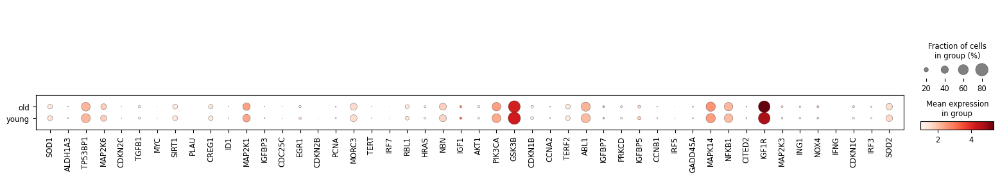

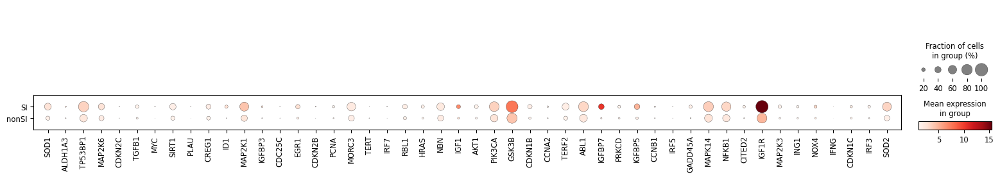

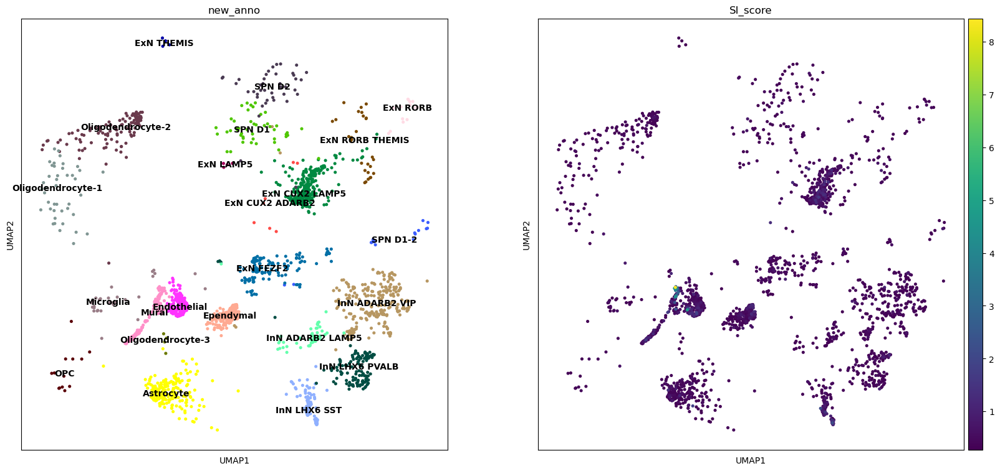

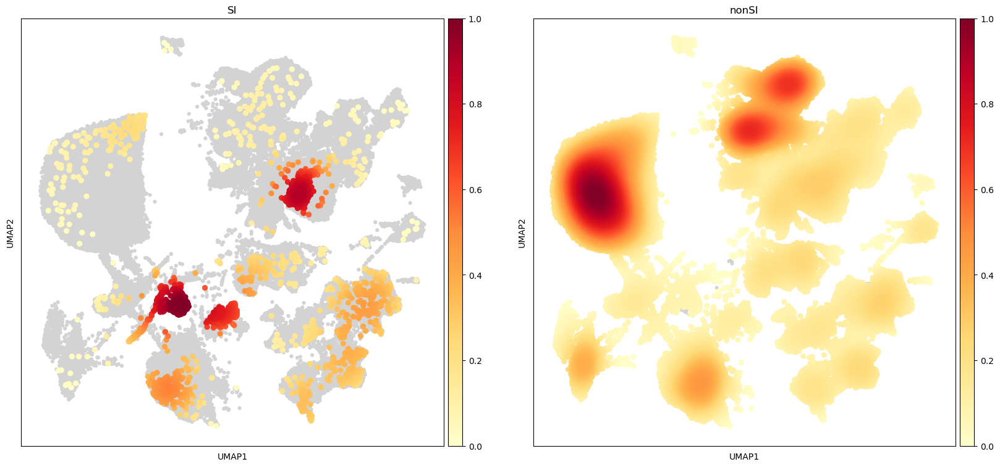

new_anno                
Astrocyte          nonSI    11073
                   SI         216
Endothelial        nonSI      710
                   SI         243
ExN CUX2 ADARB2    nonSI     3059
                   SI           7
ExN CUX2 LAMP5     nonSI     8699
                   SI         356
ExN FEZF2          nonSI     6720
                   SI         122
ExN LAMP5          nonSI     1959
                   SI           4
ExN RORB           nonSI     1952
                   SI          14
ExN RORB THEMIS    nonSI     5102
                   SI          28
ExN THEMIS         nonSI      457
                   SI           4
InN ADARB2 LAMP5   nonSI     3165
                   SI          51
InN ADARB2 VIP     nonSI     6776
                   SI         238
InN LHX6 PVALB     nonSI     4443
                   SI         123
InN LHX6 SST       nonSI     2816
                   SI         121
Microglia          nonSI     3234
                   SI          31
OPC                nonS

Brain_region                
Entorhinal cortex      nonSI    47032
                       SI         524
Middle temporal gyrus  nonSI    24727
                       SI         667
Putamen                nonSI    46278
                       SI         211
Subventricular zone    nonSI    34930
                       SI         823
Name: isSI, dtype: int64

CPU times: user 16min 25s, sys: 1min 50s, total: 18min 15s
Wall time: 17min 34s


In [17]:
%%time
score_gene_set(adata, 'SI', gene_sets['SI'], verbose=DEBUG)

### visualize combined Senescence scores

In [18]:
score_cols = ['CSS_score', 'CSP_score', 'SR_score', 'SI_score']
other_cols = ['new_anno', 'Age_group', 'broad_celltype']
temp = adata.obs[score_cols + other_cols].copy()
print(temp.shape)
display(temp.head())

(155192, 7)


,CSS_score,CSP_score,SR_score,SI_score,new_anno,Age_group,broad_celltype
barcodekey,,,,,,,
AAACCCACAGTTGGTT-1,0.991369,-0.391847,-0.705897,-0.358004,ExN CUX2 LAMP5,young,ExN
AAACCCATCTCGCTTG-1,-0.048410,-0.509405,-0.328037,-0.145817,ExN CUX2 LAMP5,old,ExN
AAACGAACACGGTAGA-1,-0.058524,-0.023305,-0.016669,-0.026645,Oligodendrocyte-1,young,Oligodendrocyte
AAACGCTAGAACTCCT-1,-0.253878,-0.233495,-0.858231,-0.474953,ExN CUX2 LAMP5,old,ExN
AAACGCTAGTCAGCCC-1,-0.054507,-0.349893,-0.886398,0.210504,ExN CUX2 LAMP5,old,ExN


In [19]:
from umap import UMAP

def plot_umap_clusters(umap_df, hue_cov=None, style_cov=None, size_cov=None):
    with rc_context({'figure.figsize': (8, 8), 'figure.dpi': 50}):
        plt.style.use('seaborn-bright')
        sns_plot = scatterplot(x='x_umap',y='y_umap', 
                                   hue=hue_cov, style=style_cov, size=size_cov, 
                                   data=umap_df, palette='viridis')
        plt.xlabel('x-umap')
        plt.ylabel('y-umap')
        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, 
                   borderaxespad=0,prop={'size': 10})
        plt.show()
        
def generate_umap_covs_df(this_df, other_covs_df=None, 
                             rnd_digits=3, merge_input=False):
    #run UMAP on the data frame features
    umap_results = UMAP(random_state=42).fit_transform(this_df)
    umap_df = DataFrame(umap_results,columns=['x_umap','y_umap'],
                                       index=this_df.index).round(rnd_digits)
    if merge_input:
        umap_df = umap_df.merge(this_df,left_index=True,right_index=True)
    if other_covs_df is not None:
        umap_df = umap_df.merge(other_covs_df, how='left', 
                                left_index=True, right_index=True)
    print(f'The dimensions of the umap df and the traits are {umap_df.shape}')
    return umap_df        

In [20]:
%%time
umap_df = generate_umap_covs_df(temp[score_cols], temp)

The dimensions of the umap df and the traits are (155192, 9)
CPU times: user 51min 26s, sys: 5min 45s, total: 57min 12s
Wall time: 2min 47s


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


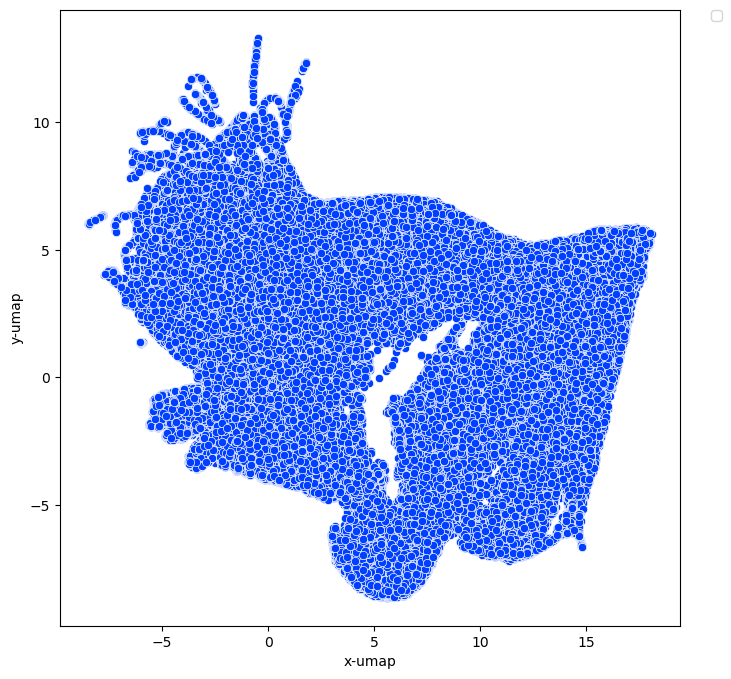

CPU times: user 341 ms, sys: 3.31 ms, total: 344 ms
Wall time: 342 ms


In [21]:
%%time
plot_umap_clusters(umap_df)

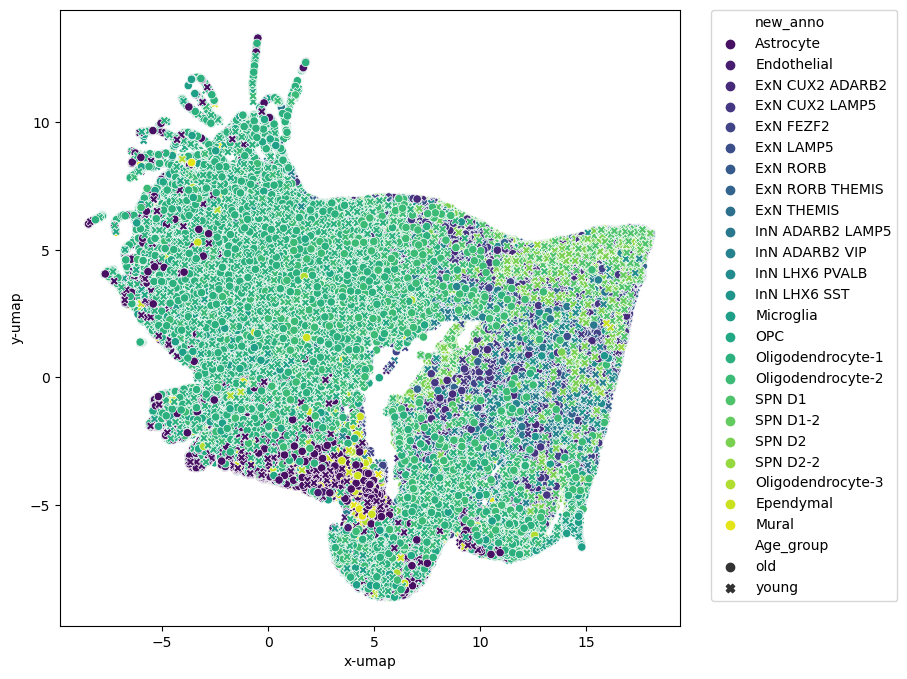

In [22]:
plot_umap_clusters(umap_df, hue_cov='new_anno', style_cov='Age_group')

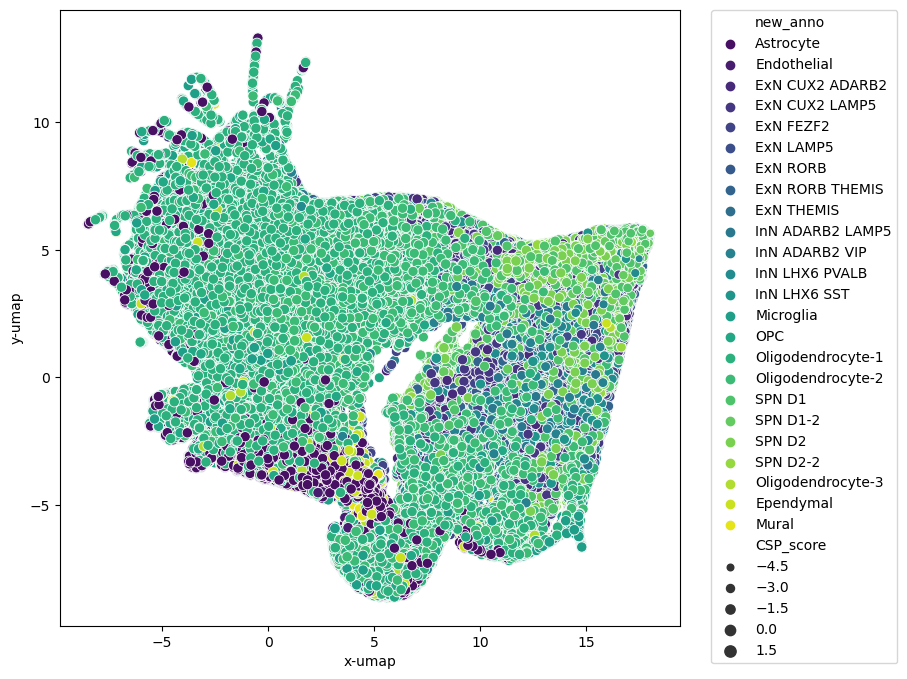

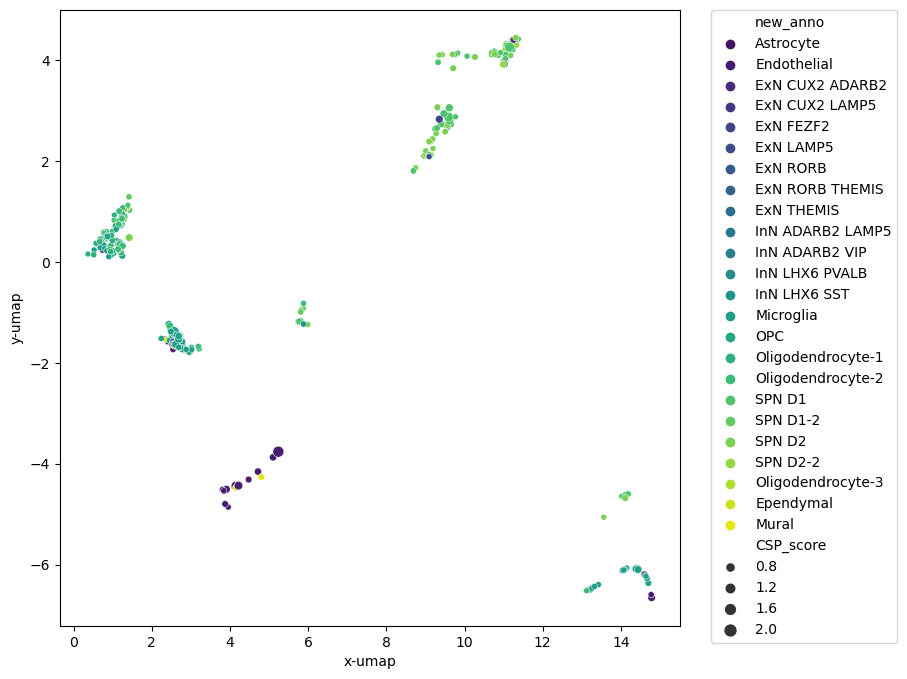

In [23]:
plot_umap_clusters(umap_df, hue_cov='new_anno', size_cov='CSP_score')
plot_umap_clusters(umap_df.loc[umap_df.CSP_score >= 0.5], hue_cov='new_anno', 
                   size_cov='CSP_score')

In [24]:
!date

Tue Oct 18 12:00:02 EDT 2022
